# Image Processing SoSe 22 - Assignment - 05

### Deadline is 02.06.2022 at 11:55am

Please solve the assignments together with a partner.
I will run every notebook. Make sure the code runs through. Select `Kernel` -> `Restart & Run All` to test it.

In [8]:
# display the plots inside the notebook
%matplotlib inline

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import pylab
from skimage.data import chelsea
from skimage.color import rgb2gray
import math
import statistics
pylab.rcParams['figure.figsize'] = (12, 8)   # This makes the plot bigger

# Exercise 1 - Filters - 5 Points

Implement and apply the filters below to noisy images. Plot the noisy image vs the filtered one

In [10]:
img = rgb2gray(chelsea() / 255.)
img.shape

(300, 451)

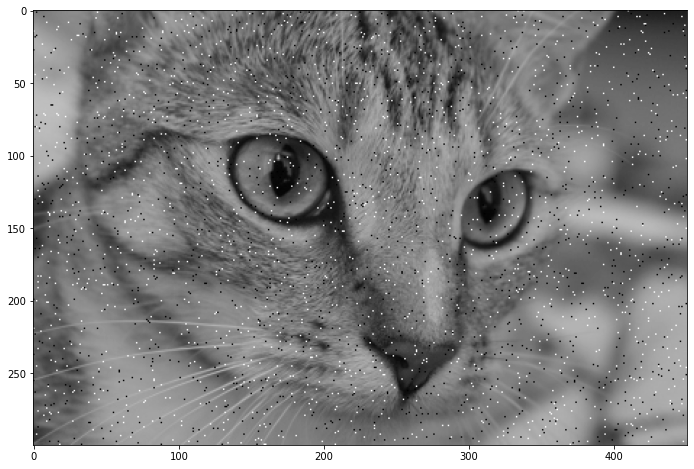

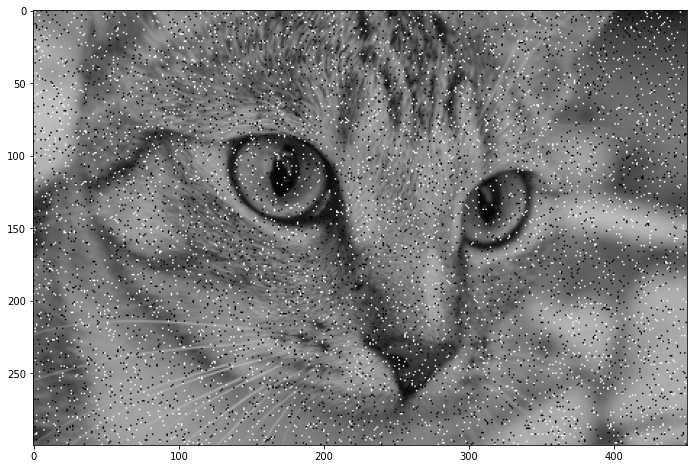

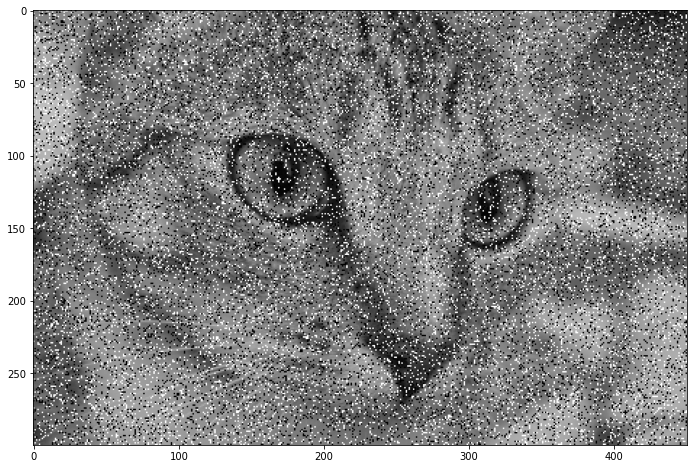

In [11]:
def salt_peper(img, p):
    peper_mask = np.random.binomial(1, p, img.shape).astype(bool)
    salt_mask = np.random.binomial(1, p, img.shape).astype(bool)
    img_noise = img.copy()
    img_noise[peper_mask] = 0
    img_noise[salt_mask] = 1
    return img_noise

salt_peper_noises = [0.01, 0.03, 0.1]
imgs_salt_peper = [salt_peper(img, p) for p in salt_peper_noises]
for img_salt_peper in imgs_salt_peper:
    plt.imshow(img_salt_peper, cmap='gray')
    plt.show()


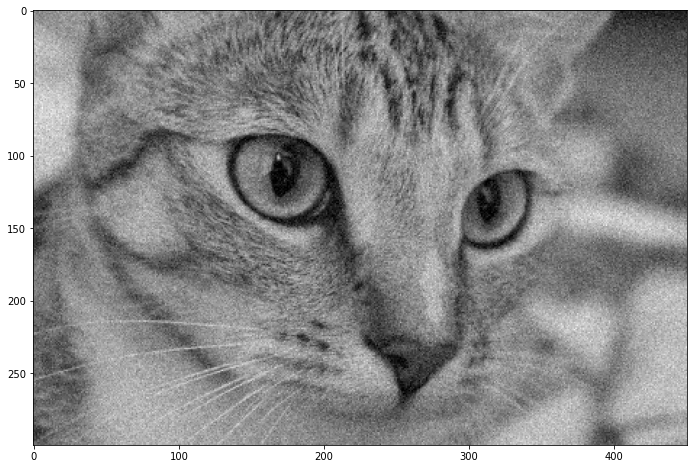

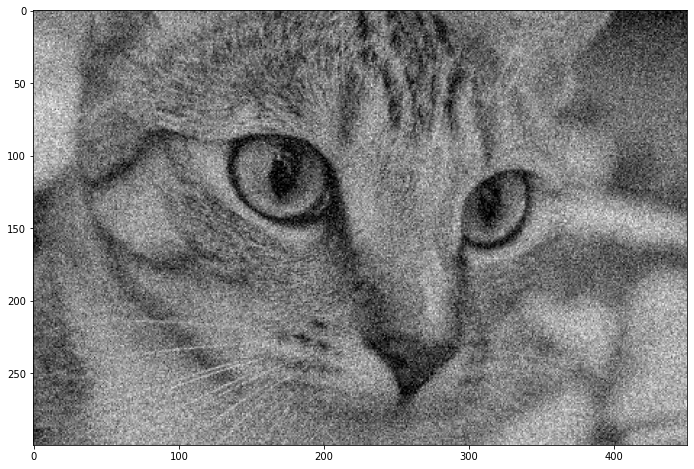

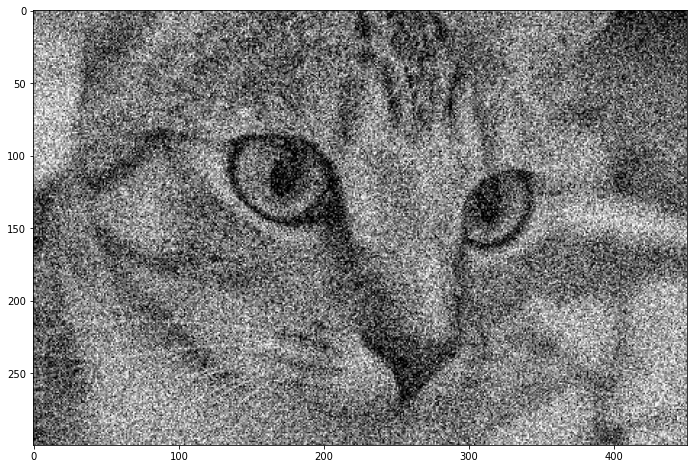

In [12]:
def gaussian_noise(img, std):
    return np.clip(img + np.random.normal(0, std, img.shape), 0, 1)

gaussian_noises = (0.05, 0.10, 0.2)
imgs_gaussian_noise = [gaussian_noise(img, s) for s in gaussian_noises]
for img_gaussian in imgs_gaussian_noise:
    plt.imshow(img_gaussian, cmap='gray')
    plt.show()

In [13]:
# implement the filters:

def arithmetic_mean(img):
    derived_img = img
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            derived_img[x+1][y+1] = (img[x][y]+img[x+1][y]+img[x+2][y]+img[x][y+1]+img[x+2][y+1]+img[x][y+2]+img[x+1][y+2]+img[x+2][y+2])/8
    return derived_img

def geometric_mean(img):
    derived_img = img
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            derived_img[x+1][y+1] = (img[x][y]*img[x+1][y]*img[x+2][y]*img[x][y+1]*img[x+1][y+1]*img[x+2][y+1]*img[x][y+2]*img[x+1][y+2]*img[x+2][y+2])**(1/9)
    return derived_img

def contraharmoic_mean(img, q=1):
    derived_img = img
    p = q+1
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            derived_img[x+1][y+1] = (img[x][y]**p+img[x+1][y]**p+img[x+2][y]**p+img[x][y+1]**p+img[x+2][y+1]**p+img[x][y+2]**p+img[x+1][y+2]**p+img[x+2][y+2]**p)/(img[x][y]**q+img[x+1][y]**q+img[x+2][y]**q+img[x][y+1]**q+img[x+2][y+1]**q+img[x][y+2]**q+img[x+1][y+2]**q+img[x+2][y+2]**q)
    return derived_img

def window_mean(img, window, x, y):
    #Stage A
    z_mean = 0
    liste = []
    for x_w in range(2*window + 1):
            for y_w in range(2*window + 1):
                z_mean = z_mean + img[x-window+x_w][y-window+y_w]
                liste.append(img[x-window+x_w][y-window+y_w])
    z_mean = z_mean / ((2*window + 1)**2)
    z_min = min(liste)
    z_max = max(liste)
    if (z_mean - z_min)>0 and (z_mean - z_max)<0:
        #Stage B
        if (img[x][x] - z_min)>0 and (img[x][x] - z_max)<0:
            z = img[x][y]
        else:
            z = z_mean
    else:
        window = window + 1
        if (x-window) > -2 and (y-window) > -2 and (x+window) < (img.shape[0]-2) and (y+window) < (img.shape[1]-2):
            z = window_mean(img, window, x, y)
        else:
            z = z_mean
    return z

def adaptive_mean(img):
    derived_img = img
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            window = 1
            derived_img[x+1][y+1] = window_mean(img, window, x+1, y+1)
    return derived_img

def window_median(img, window, x, y):
    #Stage A
    liste = []
    for x_w in range(2*window + 1):
            for y_w in range(2*window + 1):
                liste.append(img[x-window+x_w][y-window+y_w])
    z_median = statistics.median(liste)
    z_min = min(liste)
    z_max = max(liste)
    if (z_median - z_min)>0 and (z_median - z_max)<0:
        #Stage B
        if (img[x][x] - z_min)>0 and (img[x][x] - z_max)<0:
            z = img[x][y]
        else:
            z = z_median
    else:
        window = window + 1
        if (x-window) > -2 and (y-window) > -2 and (x+window) < (img.shape[0]-2) and (y+window) < (img.shape[1]-2):
            z = window_median(img, window, x, y)
        else:
            z = z_median
    return z

def adaptive_median(img):
    derived_img = img
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            window = 1
            derived_img[x+1][y+1] = window_median(img, window, x+1, y+1)
    return derived_img


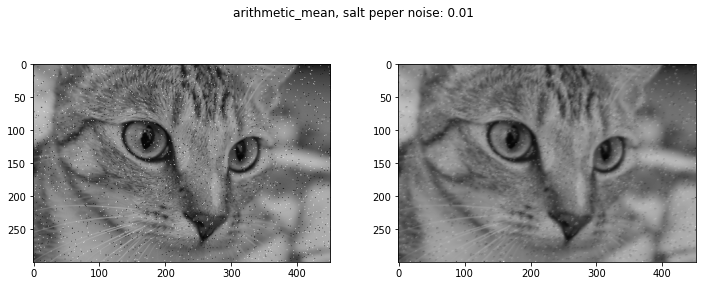

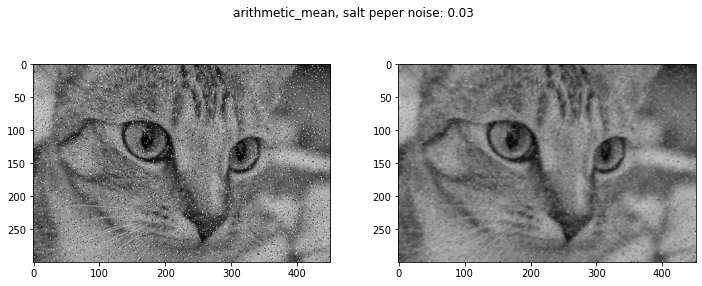

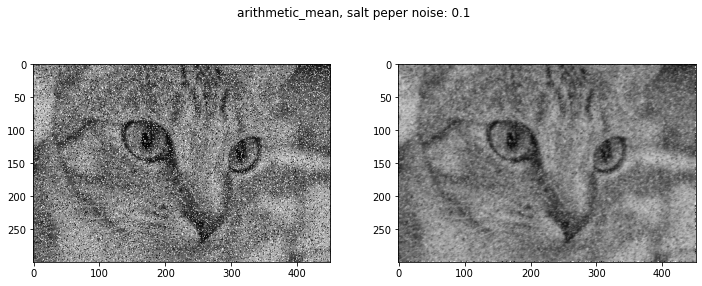

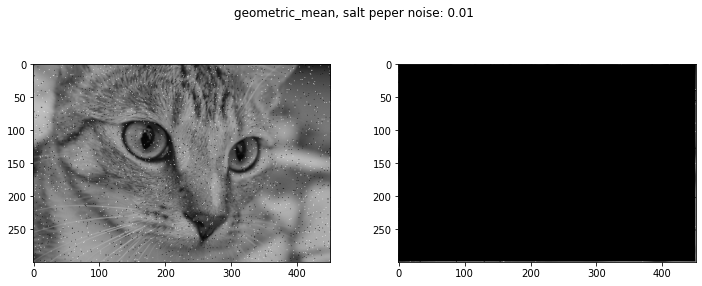

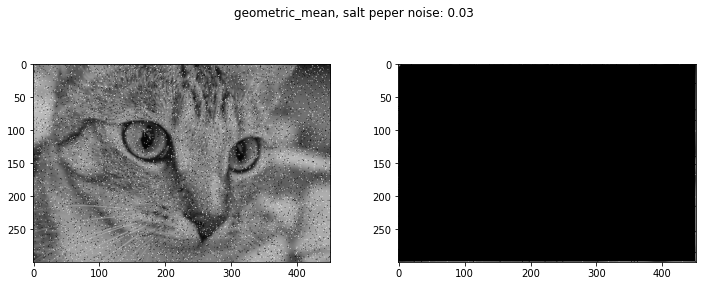

...

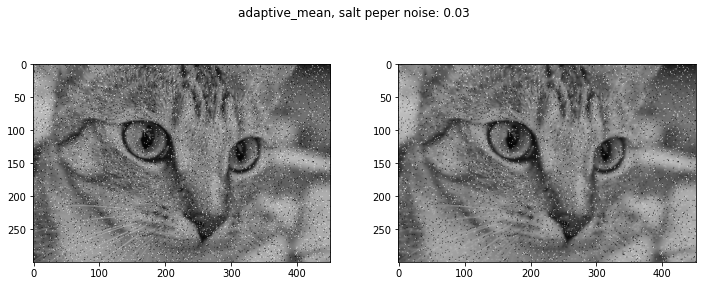

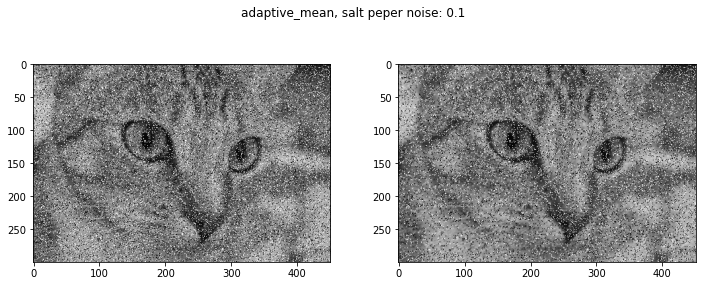

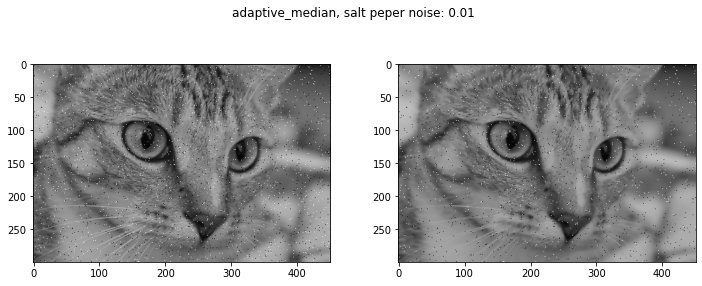

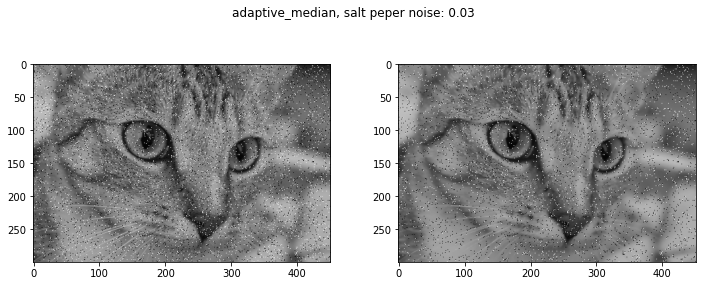

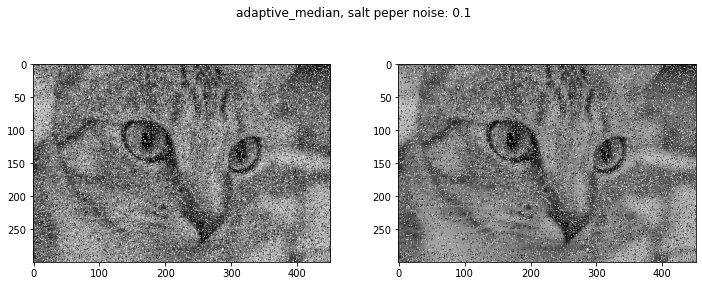

In [14]:
filters = [arithmetic_mean, geometric_mean, contraharmoic_mean, 
           adaptive_mean, adaptive_median]
for filter in filters:
    for sp, img_sp in zip(salt_peper_noises, imgs_salt_peper):
        plt.suptitle(filter.__name__ + ", salt peper noise: {}".format(sp))
        plt.subplot(221)
        plt.imshow(img_sp, cmap='gray')
        plt.subplot(222)
        plt.imshow(filter(img_sp.copy()), cmap='gray')
        plt.show()


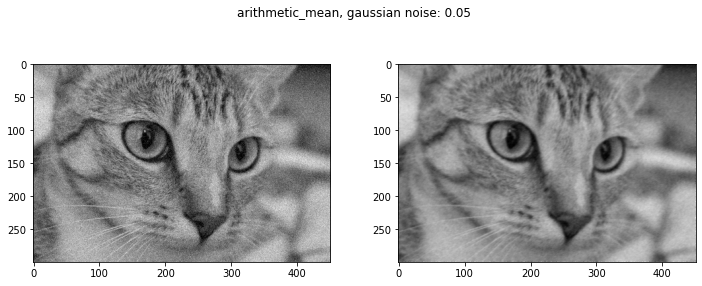

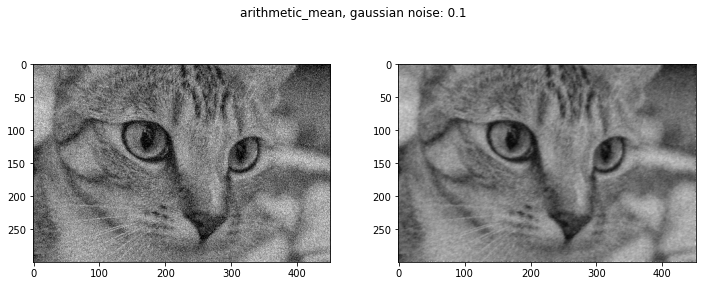

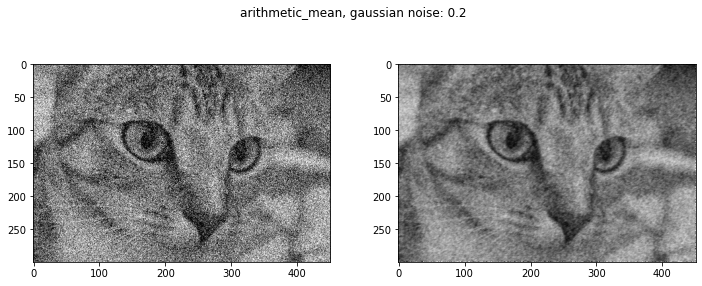

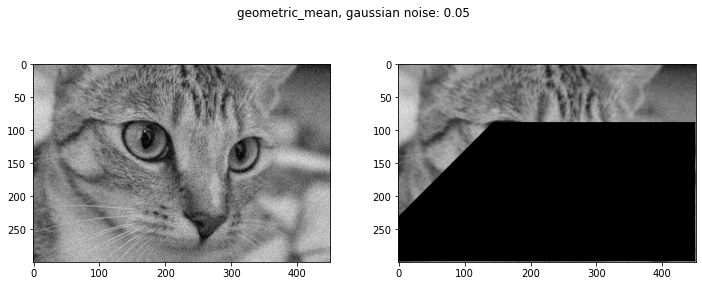

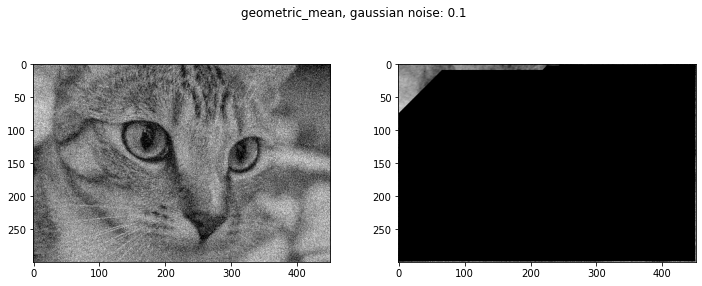

...

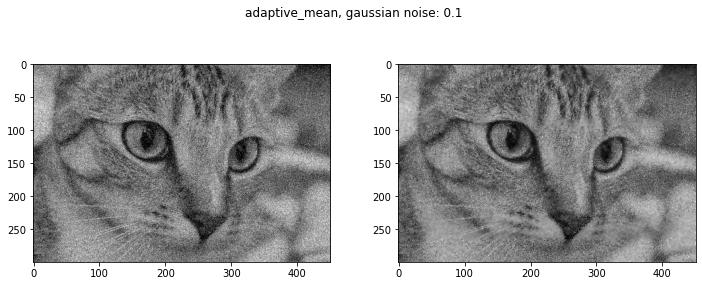

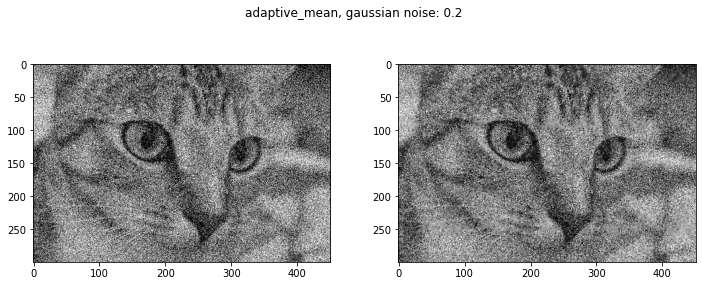

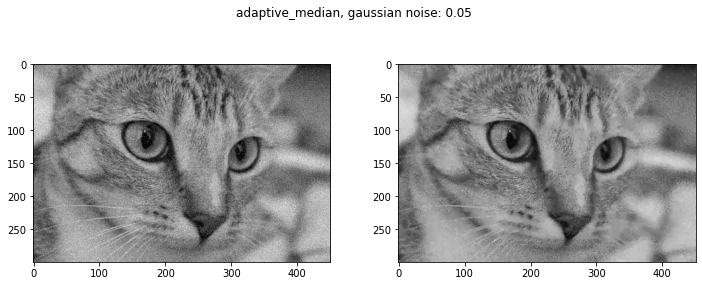

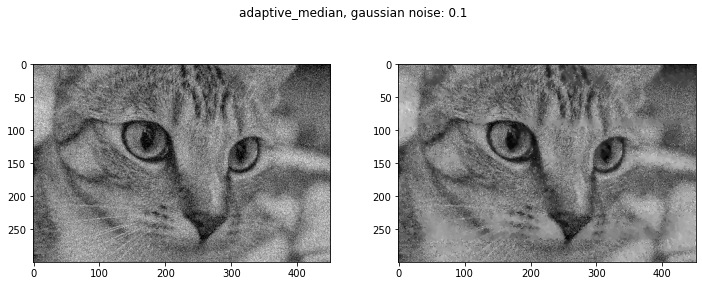

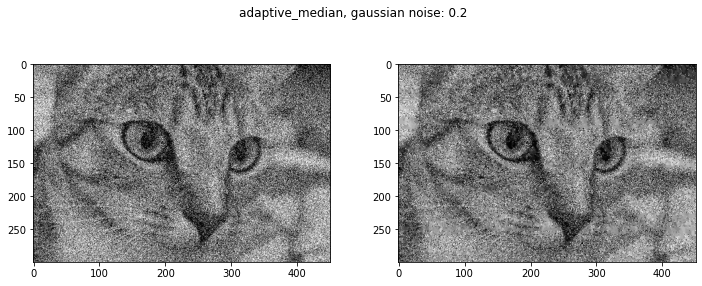

In [15]:
for filter in filters:
    for gn, img_gn in zip(gaussian_noises, imgs_gaussian_noise):
        plt.suptitle(filter.__name__ + ", gaussian noise: {}".format(gn))
        plt.subplot(221)
        plt.imshow(img_gn, cmap='gray')
        plt.subplot(222)
        plt.imshow(filter(img_gn.copy()), cmap='gray')
        plt.show()

# Exercise 2 - Sharpening - 5 Points

Sharpen the image `img_blurry`. You need to implement the `sharp_laplacian` and `unsharp_masking` functions. You might
consider some processing steps before sharpening.

In [16]:
from skimage.filters import gaussian

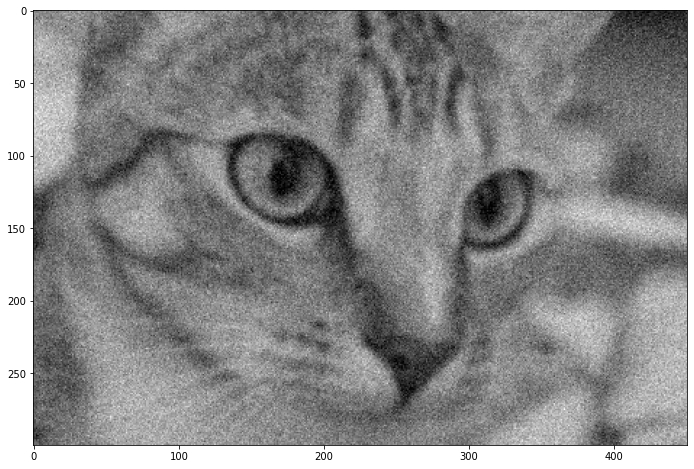

In [17]:
img_blurry = gaussian_noise(gaussian(img , 1.6), 0.07)
plt.imshow(img_blurry, cmap='gray')

In [35]:
def sharp_laplacian(img):
    """Perform sharpening with a laplacian filter"""
    derived_image = np.zeros_like(img)
    for x in range(img.shape[0]-2):
        for y in range(img.shape[1]-2):
            derived_image[x+1][y+1] = img[x+1][y] + img[x][y+1] + img[x+2][y+1] + img[x+1][y+2] - img[x+1][y+1]*3 #apply the mask directly to image
            #usually we would have -4*f(x,y) and then applying it to the image +f(x,y). Here we combine that to -3*f(x,y), cropping edge-cases
    return derived_image

def unsharp_masking(img):
    """Perform sharpening by unsharp masking"""
    img_blurrier = gaussian_noise(gaussian(img , 1.5), 0.05) # Step 1: blur the image (further)
    derived_image = np.zeros_like(img)
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            derived_image[x][y] = 2*img[x][y] - img_blurrier[x][y] # Step 2 and 3 combined: original image - blurrier image + original image = 2*original-blurrier
    return derived_image

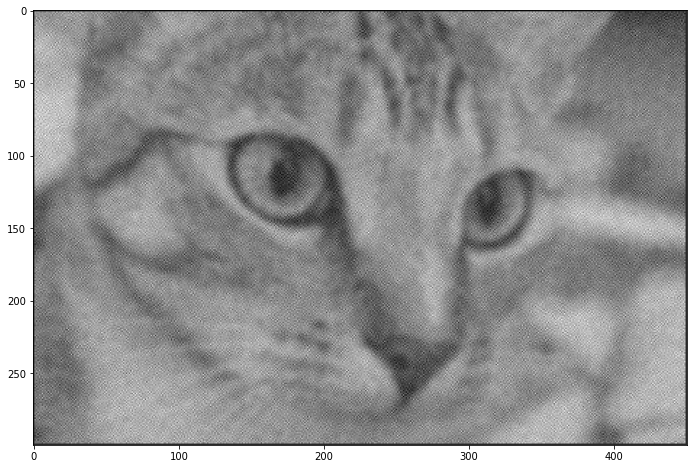

In [28]:
plt.imshow(sharp_laplacian(img_blurry), cmap='gray')
plt.show()

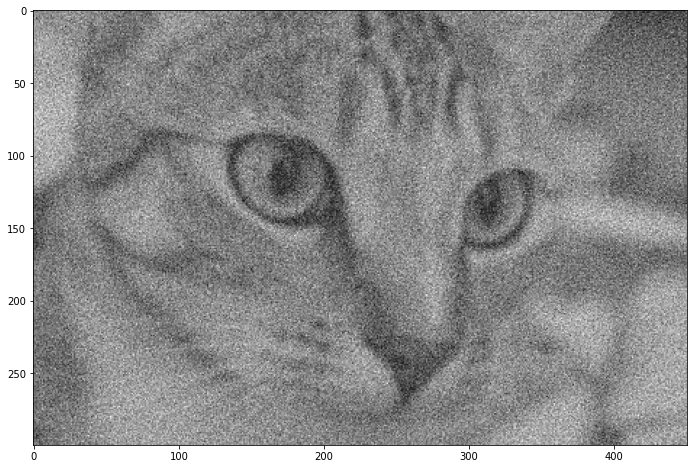

In [36]:
plt.imshow(unsharp_masking(img_blurry), cmap='gray')
plt.show()